# Import

In [1]:
from time import time
import os

import geopandas as gpd
from geopandas.plotting import plot_polygon_collection, plot_dataframe
import pandas as pd
import seaborn as sns

import matplotlib as mp
from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

import numpy as np
import pysal as ps
import random as rdm
from pysal.contrib.viz import mapping as maps

/home/sbuss/envs/sb827/local/lib/python2.7/site-packages/pysal/contrib/viz/mapping.py:33: UserWarning: Bokeh not installed. Functionality related to it will not work
  warn('Bokeh not installed. Functionality ' \


## Useful links

* http://geopandas.org/mapping.html
* http://darribas.org/gds15/content/labs/lab_03.html
* http://jose-coto.com/plotting-geopandas
* http://nbviewer.jupyter.org/github/pysal/pysal/blob/master/pysal/contrib/viz/taz_example.ipynb?create=1
* http://nbviewer.jupyter.org/gist/perrygeo/c426355e40037c452434


# Data Loading

## data sources
* https://data.cityofberkeley.info/City-Government/Zoning-Districts/2dtu-vge3
* https://data.cityofberkeley.info/City-Government/Parcels/bhxd-e6up
* https://data.cityofberkeley.info/Transportation/Streets-Network/hqnk-qfhq

In [59]:
all_parcels = gpd.read_file("gis/berkeley/Parcels.geojson").to_crs({'init': u'epsg:2227'})
# Exclude the Marina because it's huge and irrelevant
all_parcels = all_parcels[all_parcels['parcelid'] != '060 254500100']
# parcels = all_parcels.dropna()

In [29]:
zoning = gpd.read_file("gis/berkeley/Zoning Districts.geojson").to_crs({'init': u'epsg:2227'})

In [60]:
all_parcels_with_zoning = gpd.sjoin(all_parcels, zoning)
del all_parcels_with_zoning['index_right']

In [31]:
streets = gpd.read_file(os.path.realpath("gis/berkeley/Streets Network.geojson")).to_crs({'init': u'epsg:2227'})
wide_street_names = set([
    'UNIVERSITY',
    'SAN PABLO',
    'STANFORD',
    'M L KING JR',
    'SHATTUCK',
    'ADELINE',
])

def is_wide_street(ds):
    return ds['street_nam'] in wide_street_names

wide_streets = streets[streets.apply(is_wide_street, axis=1)]
narrow_streets = streets.loc[streets.index.difference(wide_streets.index)]

In [61]:
residential_zones = [
 u'C-1',
 u'C-N',
 u'C-N(H)',
 u'C-E',
 u'C-NS',
 u'C-NS(H)',
 u'C-SA',
 u'C-T',
 u'C-SO',
 u'C-W',
 u'C-DMU Buffer',
 u'C-DMU Core',
 u'C-DMU Corridor',
 u'C-DMU Outer Core',
 u'MUR',
 u'R-1',
 u'R-1A',
 u'R-1H',
 u'R-2',
 u'R-2A',
 u'R-2AH',
 u'R-2H',
 u'R-3',
 u'R-3H',
 u'R-4',
 u'R-4H',
 u'R-5',
 u'R-5H',
 u'R-S',
 u'R-SH',
 u'R-SMU',
]
residential_parcels = all_parcels_with_zoning[all_parcels_with_zoning.zoning.isin(residential_zones)]

In [8]:
heights = gpd.read_file("gzip://%s" % os.path.realpath('gis/sf/heights.geojson.gz'))
heights_reprojected = heights.to_crs(streets.crs)
residential_parcels_with_heights = gpd.sjoin(residential_parcels, heights_reprojected)
del residential_parcels_with_heights['index_right']
residential_parcels_with_heights = residential_parcels_with_heights[residential_parcels_with_heights['height'] < 1000]

# Utils

In [66]:
def save_map(fig, ax, fname, dpi=300, **kwargs):
    fig.set_dpi(300)
    fig.tight_layout()
    sns.despine(ax=ax, left=True, bottom=True)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    fig.savefig(fname, dpi=dpi, bbox_inches='tight', **kwargs)

In [62]:
def doit2(parcels, streets, street_width, street_width_max=140):
    parcels_view = parcels.copy()
    sc = streets.copy(deep=True)
    wide_streets = sc[sc.apply(is_wide_street, axis=1)].copy(deep=True)
    
    # Track indices of parcels at 85' height
    idx = set()
    
    # Every parcel touching a wide street is automatically 85'
    wide_streets['geometry'] = wide_streets.buffer(50)
    wide_streets_touching_parcels = gpd.sjoin(wide_streets, parcels_view)
    # Add the parcels that are being touched to our index set
    idx.update(wide_streets_touching_parcels.index_right.values.tolist())
    parcels_view = parcels.loc[parcels.index.difference(idx)]
    # Now only look at narrow streets
    sc = sc.loc[sc.index.difference(wide_streets_touching_parcels.index)]
    
    # Take 5' off of the street width and delete any streets that intersect with a parcel
    sc['geometry'] = streets.buffer(((street_width-5) * 1.0)/2)
    streets_touching_parcels = gpd.sjoin(sc, parcels_view)
    sc = sc.loc[sc.index.difference(streets_touching_parcels.index)]
    
    # Now we should only have streets wider than street_width left
    # For 10' increments starting at street_width+5...
    for width in range(street_width + 5, street_width_max, 10):
        # Dilate the streets
        sc['geometry'] = streets.loc[sc.index].buffer((width * 1.0)/2)
        # Find parcels that overlap with the street
        streets_touching_parcels = gpd.sjoin(sc, parcels_view)
        # Add the parcels that are being touched to our index set
        idx.update(streets_touching_parcels.index_right.values.tolist())
        parcels_view = parcels.loc[parcels.index.difference(idx)]
        # And delete the street segments touching parcels
        sc = sc.loc[sc.index.difference(streets_touching_parcels.index)]
    # But ignore UCB and the marina?
    idx.discard(parcels[parcels['parcelid'].isin([
        '057 204200410',  # UCB
        '048H769000400',  # I don't know what this is
    ])].index.values[0])
    return parcels.loc[idx]

In [11]:
def doit(parcels, streets, street_width):
    old_geo = streets['geometry']
    streets['geometry'] = streets.buffer((street_width * 1.0)/2)
    parcels_intersects_with_streets = gpd.sjoin(parcels, streets)
    parcels_not_touching_street_buffer = parcels[~parcels['mapblklot'].isin(parcels_intersects_with_streets['mapblklot'].unique())]
    streets['geometry'] = old_geo
    return parcels_not_touching_street_buffer

# Results

In [63]:
eighty_five_parcels = doit2(residential_parcels, streets, 70)
fifty_five_parcels = residential_parcels.loc[residential_parcels.index.difference(eighty_five_parcels.index)]

# eighty_five_parcels.to_file('gis/sf/computed/parcels_eighty_five_feet.geojson', driver="GeoJSON")
# fifty_five_parcels.to_file('gis/sf/computed/parcels_fifty_five_feet.geojson', driver="GeoJSON")

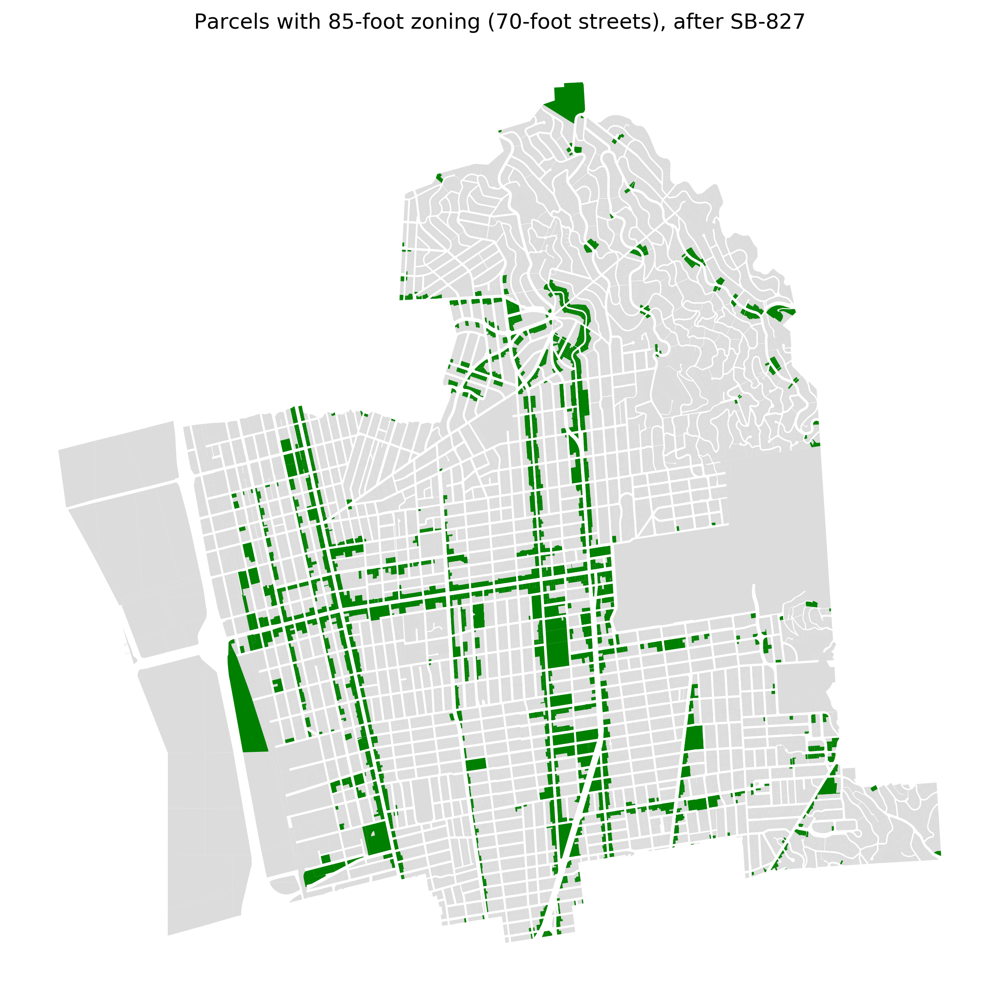

In [67]:
f = plt.gcf()
ax = f.gca()
ax.set_title('Parcels with 85-foot zoning (70-foot streets), after SB-827')
plot_dataframe(all_parcels, ax=ax, facecolor='gainsboro', zorder=0)
plot_dataframe(eighty_five_parcels, ax=ax, facecolor='green', zorder=1)
f.set_size_inches(8, 8)

save_map(f, ax, "figs/berkeley/berkeley-sb827-parcels-wide-streets-70ft-buffer-all-parcels.png", dpi=300)
save_map(f, ax, "figs/berkeley/berkeley-sb827-parcels-wide-streets-70ft-buffer-all-parcels-1200dpi.png", dpi=1200)

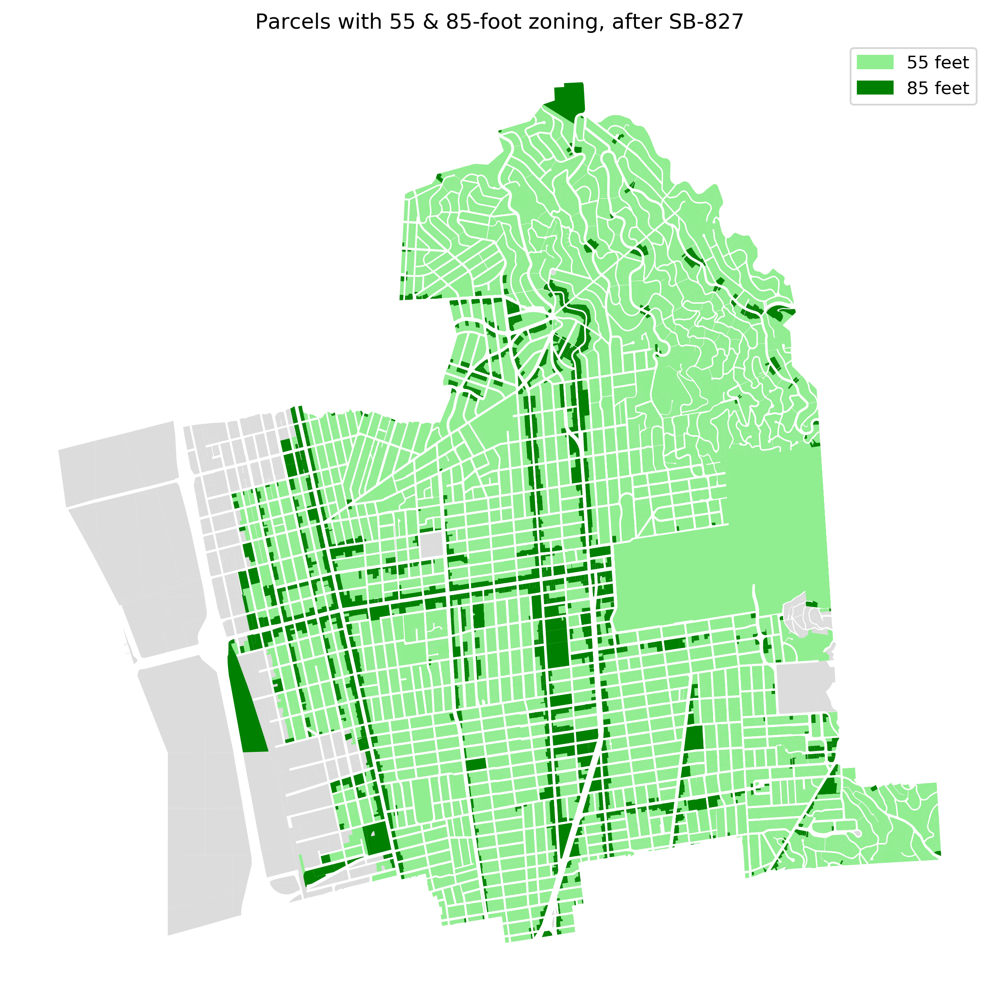

In [68]:
f = plt.gcf()
ax = f.gca()
ax.set_title('Parcels with 55 & 85-foot zoning, after SB-827')
plot_dataframe(all_parcels, ax=ax, facecolor='gainsboro', zorder=0)
plot_dataframe(fifty_five_parcels, ax=ax, facecolor='lightgreen', zorder=1)
plot_dataframe(eighty_five_parcels, ax=ax, facecolor='green', zorder=2)
f.set_size_inches(8, 8)

try:
    import matplotlib.patches as mpatches
    import matplotlib.pyplot as plt

    fifty_five = mpatches.Patch(color='lightgreen', label='55 feet')
    eighty_five = mpatches.Patch(color='green', label='85 feet')
    plt.legend(handles=[fifty_five, eighty_five])
except:
    pass

save_map(f, ax, "figs/berkeley/berkeley-sb827-all-parcels.png")
save_map(f, ax, "figs/berkeley/berkeley-sb827-all-parcels-1200dpi.png", dpi=1200)

# Difference

In [18]:
residential_parcels_with_heights.loc[eighty_five_parcels.index, 'difference'] = 85 - eighty_five_parcels.loc[eighty_five_parcels.index, 'height']
residential_parcels_with_heights.loc[fifty_five_parcels.index, 'difference'] = 55 - fifty_five_parcels.loc[fifty_five_parcels.index, 'height']

idx = (residential_parcels_with_heights['difference'] < 1) | (pd.isna(residential_parcels_with_heights['difference']))
residential_parcels_with_heights.loc[idx,'difference'] = 0

residential_parcels_with_heights['floors'] = np.floor_divide(residential_parcels_with_heights['difference'], 10)
residential_parcels_with_heights[residential_parcels_with_heights['floors'] <= 0] = 0.0
residential_parcels_with_heights['floors'] = residential_parcels_with_heights['floors'].astype(int)

# residential_parcels_with_heights.to_file('gis/sf/computed/residential_parcels_with_heights.geojson', driver="GeoJSON")

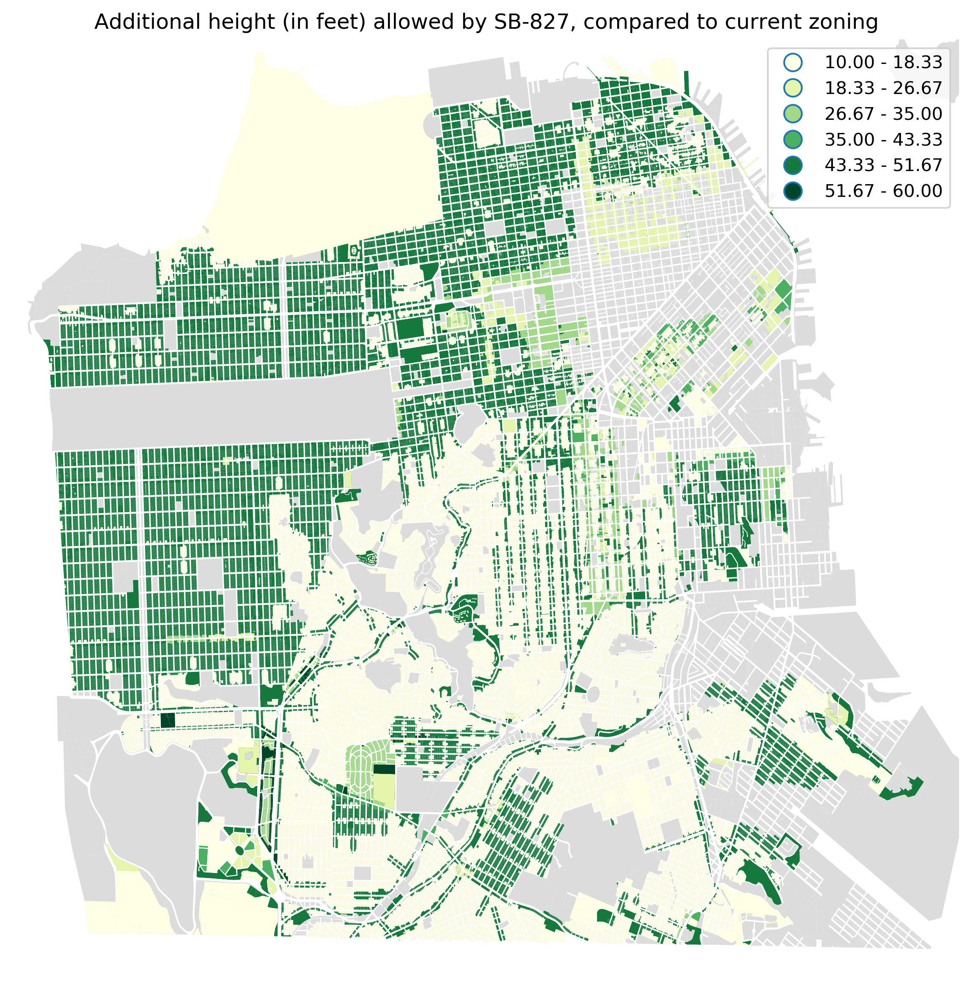

In [19]:
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.light_palette("green").as_hex())

f = plt.gcf()
ax = f.gca()
ax.set_title('Additional height (in feet) allowed by SB-827, compared to current zoning')
plot_dataframe(parcels_reprojected, ax=ax, facecolor='gainsboro', zorder=0)
#plot_dataframe(parcels_with_heights, ax=ax, column='difference', cmap=sns.cubehelix_palette(5, start=.5, rot=-.75, as_cmap=True), zorder=1)
plot_dataframe(residential_parcels_with_heights[residential_parcels_with_heights['difference'] > 0],
               ax=ax, k=6, column='difference', scheme='equal_interval', cmap='YlGn', legend=True, zorder=1)

frame_mainland(ax)
f.set_size_inches(8, 8)
save_map(f, ax, "figs/sf/sb827-upzoned-parcels.png", dpi=300)
save_map(f, ax, "figs/sf/sb827-upzoned-parcels-1200dpi.png", dpi=1200)

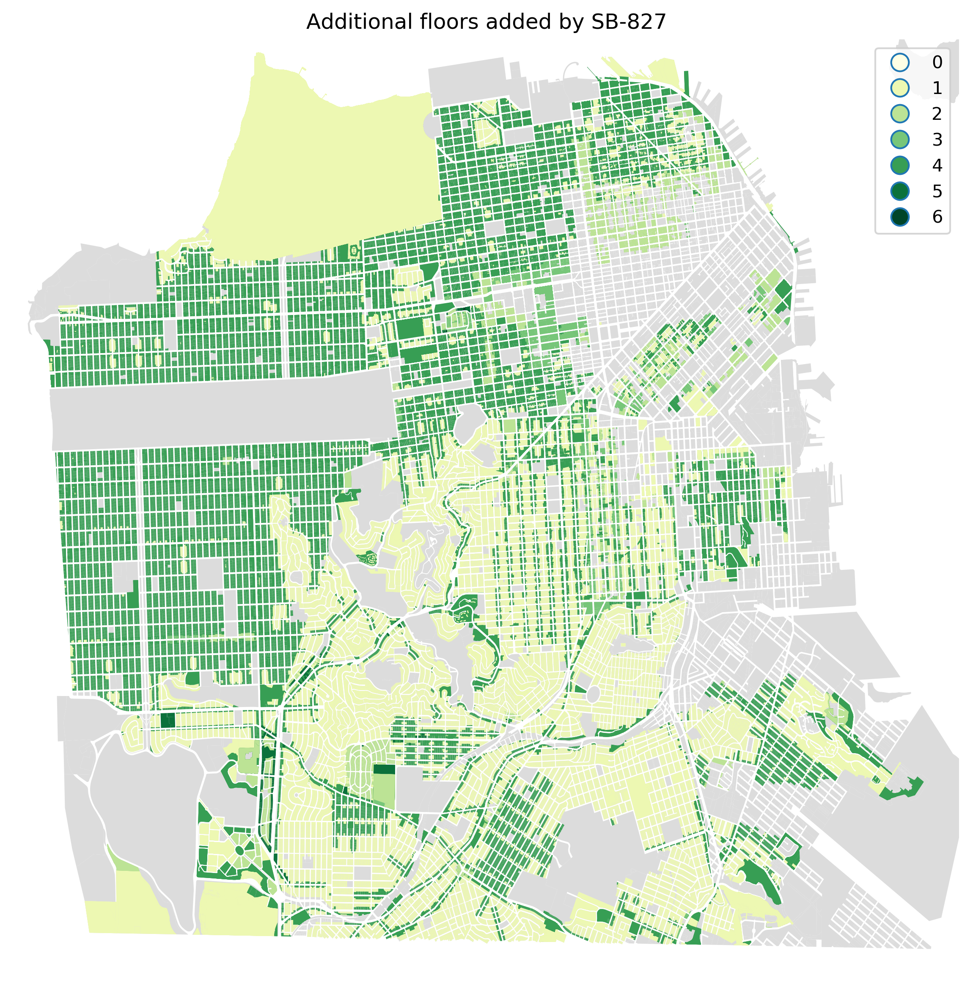

In [20]:
from matplotlib.colors import ListedColormap
my_cmap = ListedColormap(sns.light_palette("green").as_hex())

f = plt.gcf()
ax = f.gca()
ax.set_title('Additional floors added by SB-827')
plot_dataframe(parcels_reprojected, ax=ax, facecolor='gainsboro', zorder=0)
plot_dataframe(residential_parcels_with_heights, ax=ax, categorical=True,
               column='floors', cmap='YlGn', legend=True, zorder=1)

ax.get_legend().set_bbox_to_anchor((1, 1))

frame_mainland(ax)
f.set_size_inches(8, 8)
save_map(f, ax, "figs/sf/sb827-new-floors.png", dpi=300)
save_map(f, ax, "figs/sf/sb827-new-floors-1200dpi.png", dpi=1200)